In [1]:
import uproot
import pandas as pd
import numpy as np
import plotly
from pathlib import Path
import plotly.express as px
import wandb

In [2]:
cd ..

/global/u2/s/schuya/hgcal-dev


In [3]:
from visualization.hgcal import Event

ModuleNotFoundError: No module named 'visualization'

In [13]:
wandb_id = '20200820173002'
wandb_project = 'hgcal-spvcnn'
wandb_entity = 'uw-hgcal'

In [14]:
input_dir = Path('/global/cscratch1/sd/schuya/hgcal-dev/data/hgcal/rawpointclouds')
prediction_dir = Path('/global/cscratch1/sd/schuya/hgcal-dev/predictions/hgcal/semantic-3')

In [15]:
event_names = [a.name for a in sorted(prediction_dir.glob('*.npz'))]

In [16]:
events = [Event(input_dir / e, prediction_dir / e) for e in event_names]

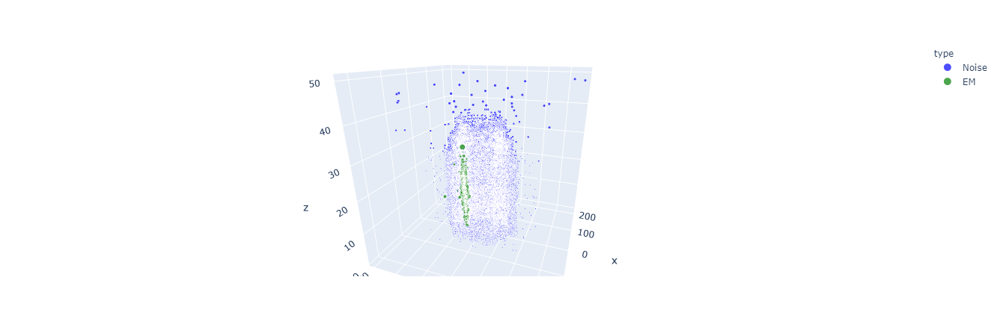

In [22]:
example_3d_truth_event = events[5].plot_3d(truth=True)
example_3d_truth_event.show()

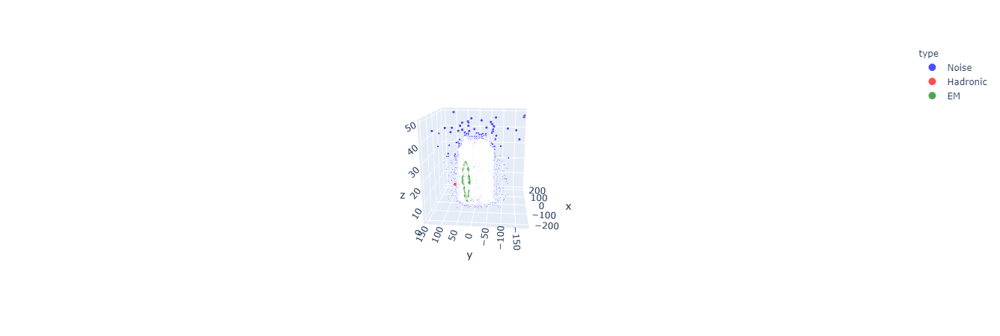

In [23]:
example_3d_pred_event = events[5].plot_3d(truth=False)
example_3d_pred_event.show()

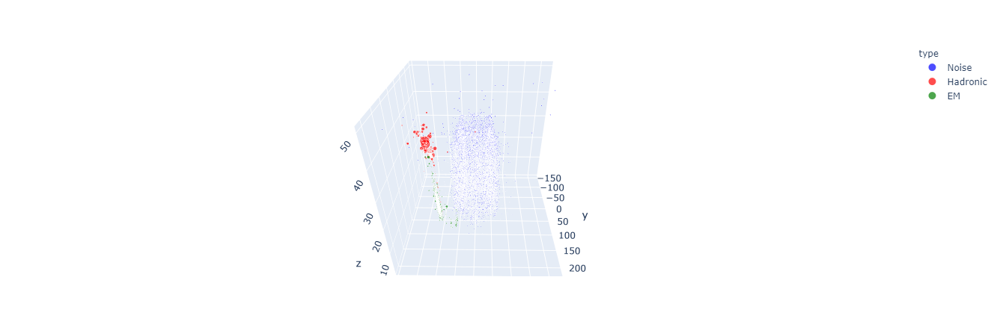

In [30]:
example_3d_truth_event_2 = events[25].plot_3d(truth=True)
example_3d_truth_event_2.show()

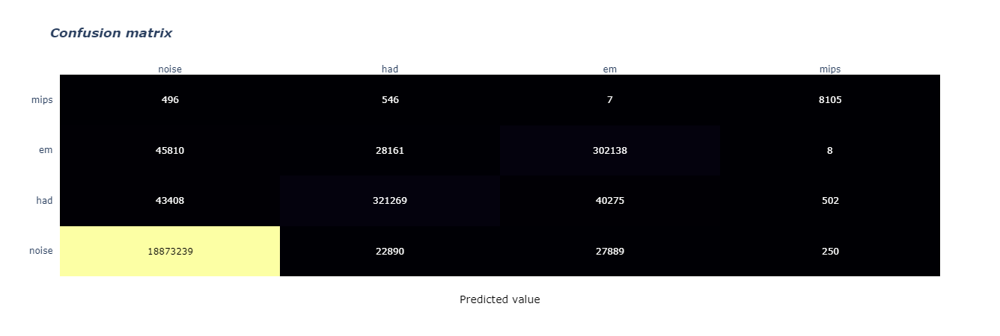

In [19]:
Event.plot_confusion_matrix(events, normalize=False)

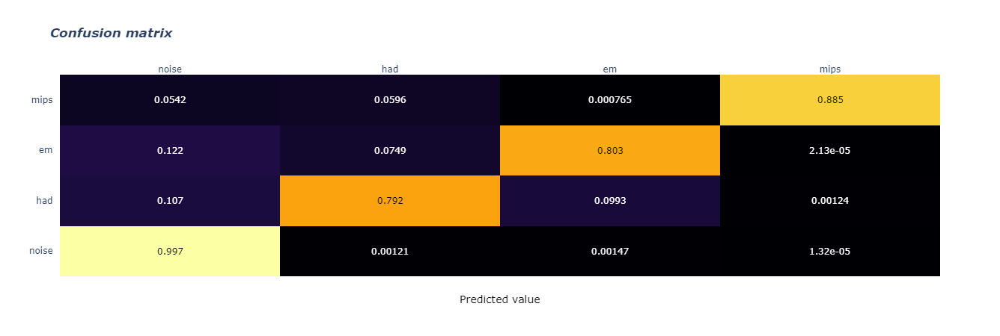

In [20]:
normalized_confusion_matrix_fig = Event.plot_confusion_matrix(events, normalize=True)
normalized_confusion_matrix_fig.show()

In [31]:
wandb.init(id=wandb_id, entity=wandb_entity, project=wandb_project, resume='allow')

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


W&B Run: https://app.wandb.ai/uw-hgcal/hgcal-spvcnn/runs/20200820173002

Streaming file created twice in same run: /global/u2/s/schuya/wandb/run-20200902_095441-20200820173002/wandb-history.jsonl
Streaming file created twice in same run: /global/u2/s/schuya/wandb/run-20200902_095441-20200820173002/wandb-events.jsonl


In [32]:
wandb.log({'hgcal normalized confusion matrix': normalized_confusion_matrix_fig})
wandb.log({'hgcal Example 3D Truth Event': example_3d_truth_event})
wandb.log({'hgcal Example 3D Reconstructed Event': example_3d_pred_event})

Failed to query for notebook name, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable
wandb: Wandb version 0.9.6 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
